In [39]:
import pandas as pd
import numpy as np

df = pd.read_csv("donnees-defi-egc.csv", low_memory=False)

# uniformiser les "?"
df = df.replace("?", np.nan)

# casts utiles
for c in ["ANNEEDEPLANTATION", "ANNEEREALISATIONDIAGNOSTIC", "ANNEETRAVAUXPRECONISESDIAG"]:
    df[c] = pd.to_numeric(df[c], errors="coerce")

## Nettoyage des "?" et création du GéoDataframe

In [47]:
df = df.replace("?", np.nan).copy()

# types
for c in ["ANNEEDEPLANTATION","ANNEEREALISATIONDIAGNOSTIC","ANNEETRAVAUXPRECONISESDIAG"]:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

# geodataframe en EPSG:3945 (format correspondant pour nos coordonnées)
gdf = gpd.GeoDataFrame(
    df,
    geometry=[Point(xy) for xy in zip(df["coord_x"], df["coord_y"])],
    crs="EPSG:3945"
)

# pour affichage web/carto (conversion lat/lon correspondante)
gdf_wgs = gdf.to_crs(4326)

# défauts multi-label
# on réunit les zone potentielle de défaut (4 zones)
loc_cols = ["Collet","Houppier","Racine","Tronc"]
for c in loc_cols:
    gdf[c] = pd.to_numeric(gdf[c], errors="coerce")

# compteur du nombre de zone touché par défaut
gdf["NB_LOCALISATIONS_DEFAUT"] = gdf[loc_cols].fillna(0).sum(axis=1)

# booléen qui vérifie si il y a au moin une zone avec un défaut
gdf["A_UN_DEFAUT_LOCALISE"] = (gdf["NB_LOCALISATIONS_DEFAUT"] > 0).astype(int)

# âge estimé
ref_year = gdf["ANNEEREALISATIONDIAGNOSTIC"].fillna(2025)  # ref 2025 si manquant
gdf["AGE_ESTIME"] = ref_year - gdf["ANNEEDEPLANTATION"]

Chaque arbre devient un **point (x,y)**. 

On regroupe les 4 zone de l'arbre qui peuvent contenir un défaut. On vérifie si au moin une zone est touché et on compte toujours le nombre de zone touché. Cela est utile pour prioriser et faire des stats par secteur.

On estime aussi l'age de l'arbre en regardant la date de plantation et l'année du diagnostic effectué (si vide on suppose 2025 pour l'exercice). 

**On convertit les arbres en points géographiques, puis on dérive des indicateurs : âge estimé et intensité des défauts (multi-localisations).**

## Création du SCORE_URGENCE

On souhaite créer un score simple afin de déterminer les arbres/secteur les plus urgents à traiter

In [50]:
# normalisation de texte général
def norm(s):
    return str(s).strip().lower()

gdf["VIGUEUR_N"] = gdf["VIGUEUR"].map(norm) if "VIGUEUR" in gdf.columns else ""
gdf["NOTE_N"] = gdf["NOTEDIAGNOSTIC"].map(norm) if "NOTEDIAGNOSTIC" in gdf.columns else ""
gdf["PRIO_N"] = gdf["PRIORITEDERENOUVELLEMENT"].map(norm) if "PRIORITEDERENOUVELLEMENT" in gdf.columns else ""

Le score commence à **0** puis :

**+3** si DEFAUT == 1

**+0** à **+3** selon le nombre de localisations (NB_LOCALISATIONS_DEFAUT)

**+2** si la vigueur contient “faible”

**+2** si la priorité de renouvellement contient “moins de 5”

**+2** si la note contient “mauvais / danger / urgent”

**+1** si âge ≥ 60, encore **+1** si âge ≥ 80

In [51]:
gdf["SCORE_URGENCE"] = 0

# défaut (si binaire 0/1)
if "DEFAUT" in gdf.columns:
    gdf["DEFAUT"] = pd.to_numeric(gdf["DEFAUT"], errors="coerce")
    gdf.loc[gdf["DEFAUT"]==1, "SCORE_URGENCE"] += 3

# multi-localisation
gdf["SCORE_URGENCE"] += gdf["NB_LOCALISATIONS_DEFAUT"].clip(0, 3)

# vigueur faible
if "VIGUEUR" in gdf.columns:
    gdf.loc[gdf["VIGUEUR_N"].str.contains("faible", na=False), "SCORE_URGENCE"] += 2

# priorité renouvellement rapide
if "PRIORITEDERENOUVELLEMENT" in gdf.columns:
    gdf.loc[gdf["PRIO_N"].str.contains("moins de 5|< ?5", na=False), "SCORE_URGENCE"] += 2

# note diagnostic “mauvais / danger / urgent” (si ces mots existent)
if "NOTEDIAGNOSTIC" in gdf.columns:
    gdf.loc[gdf["NOTE_N"].str.contains("mauvais|danger|urgent", na=False), "SCORE_URGENCE"] += 2

# âge très élevé (optionnel, simple)
gdf.loc[gdf["AGE_ESTIME"] >= 60, "SCORE_URGENCE"] += 1
gdf.loc[gdf["AGE_ESTIME"] >= 80, "SCORE_URGENCE"] += 1

On utilise ici un scoring et non pas de la prédiction IA parceque : 

**1.** Notre modèle a été entrainé sur ses jeux de donnée en majorité (80%)

**2.** Dans le contexte d'une mairie un score est plus facilement expliquable que du ML

## Agrégation par secteur

In [52]:
grp = (gdf
       .groupby("ADR_SECTEUR", dropna=False)
       .agg(
            nb_arbres=("geometry","size"),
            pct_defaut=("DEFAUT", lambda s: np.nanmean(s==1)*100),
            pct_defaut_loc=("A_UN_DEFAUT_LOCALISE","mean"),
            score_moy=("SCORE_URGENCE","mean"),
            age_moy=("AGE_ESTIME","mean"),
            top_travaux=("TRAVAUXPRECONISESDIAG", lambda s: s.value_counts().head(1).index[0] if s.notna().any() else np.nan)
       )
       .sort_values(["score_moy","pct_defaut"], ascending=False)
      )

grp.head(10)

,nb_arbres,pct_defaut,pct_defaut_loc,score_moy,age_moy,top_travaux
ADR_SECTEUR,,,,,,
2,3113,43.559268,0.435593,1.954385,9.597816,Taille formation et mise au gabarit
5,2943,35.507985,0.355080,1.524295,9.724771,Taille formation et mise au gabarit
4,2162,31.082331,0.310823,1.340426,9.571693,Taille formation et mise au gabarit
6,2961,30.091185,0.300912,1.316447,9.488011,Taille formation et mise au gabarit
3,2518,27.958697,0.279587,1.261716,8.876886,Taille formation et mise au gabarit
1,1678,19.845054,0.198451,0.843862,7.523838,Controle


C'est une comparaison des secteurs sur des indicateurs de risque et d’entretien, pour cibler les zones prioritaires. Ici on remarque que les secteur 2 et 5 sont les deux prioritaires avec une combinaison de nombre d'arbre ayant des défauts et de score moyen élevé.

## Top 10 arbres prioritaire par secteur

In [57]:
top_actions = (gdf
               .sort_values("SCORE_URGENCE", ascending=False)
               .groupby("ADR_SECTEUR")
               .head(10)[["ADR_SECTEUR","GENRE_BOTA","ESPECE","AGE_ESTIME","DEFAUT","NB_LOCALISATIONS_DEFAUT",
                          "TRAVAUXPRECONISESDIAG","ANNEETRAVAUXPRECONISESDIAG","SCORE_URGENCE","coord_x","coord_y"]]
              )
top_actions[top_actions["ADR_SECTEUR"] == 2]

,ADR_SECTEUR,GENRE_BOTA,ESPECE,AGE_ESTIME,DEFAUT,NB_LOCALISATIONS_DEFAUT,TRAVAUXPRECONISESDIAG,ANNEETRAVAUXPRECONISESDIAG,SCORE_URGENCE,coord_x,coord_y
12374,2,Platanus,acerifolia,11.0,1,3,Taille mise en sécurité,2016.0,6,1.913546e+06,4.225252e+06
7189,2,Platanus,acerifolia,11.0,1,3,Taille mise en sécurité,2016.0,6,1.913367e+06,4.225482e+06
8067,2,Platanus,acerifolia,11.0,1,3,Taille mise en sécurité,2016.0,6,1.913467e+06,4.225233e+06
8993,2,Platanus,acerifolia,11.0,1,3,Taille mise en sécurité,2016.0,6,1.913525e+06,4.225280e+06
12439,2,Platanus,acerifolia,11.0,1,3,Taille formation et mise au gabarit,2016.0,6,1.913378e+06,4.225543e+06
9350,2,Populus,nigra,10.0,1,3,Taille de bois mort,2014.0,6,1.914405e+06,4.224082e+06
421,2,Platanus,acerifolia,11.0,1,3,Taille mise en sécurité,2016.0,6,1.913564e+06,4.225195e+06
12285,2,Platanus,acerifolia,11.0,1,3,Taille mise en sécurité,2016.0,6,1.913517e+06,4.225296e+06
4551,2,Platanus,acerifolia,11.0,1,4,Controle,2017.0,6,1.913491e+06,4.225373e+06
12369,2,Platanus,acerifolia,11.0,1,3,Controle,2017.0,6,1.913461e+06,4.225581e+06


En plus de la prioritisation par secteur précédente, on stock les 1à arbres prioritaire par secteurs.

## Travail préconisé vs score (est-ce que le score “capte” les urgences ?)

Ici on cherche a savoir si plus un travaux préconisé est "lourd" à effectué cela est bien du à un arbre ayant un score élevé.

On considère comme travaux "lourd" notamment l'abattage entier de l'arbre, la taille de branche/bois mettant en danger les passants ou encore l'haubannage consistant a renforcé le tronc/branches d'un arbre fragilisé.

In [61]:
tab_trav = (gdf.groupby("TRAVAUXPRECONISESDIAG")
            .agg(nb=("geometry","size"),
                 score_moy=("SCORE_URGENCE","mean"),
                 pct_defaut=("DEFAUT", lambda s: np.nanmean(s==1)*100))
            .sort_values("nb", ascending=False))

tab_trav

,nb,score_moy,pct_defaut
TRAVAUXPRECONISESDIAG,,,
Taille formation et mise au gabarit,4616,1.341854,31.759099
Controle,2493,1.270758,27.396711
Taille de bois mort,1660,2.343976,53.674699
Taille cohabitation,564,1.168440,27.127660
Taille mise en sécurité,418,4.301435,90.669856
Taille déclaircie,365,0.534247,12.876712
Abattage,220,4.427273,93.181818
Aménagement pieds darbres,162,1.734568,38.271605
Controle tuteur attache ou protection,144,0.916667,22.222222


On remarque qu'effectivement les travaux d'abattage, de taille de mise en sécurité ainsi que d'haubannage sont effectués sur les arbres ayant des scores élevés. 

On remarque aussi une valeur similaire pour le contrôle résistographes.

## Quels travaux sont surreprésentés dans les scores élevés ?

Dans la continuité de l'étape précédente on cherche a vois les travaux les plus effectué pour des arbres en très mauvaises états (selon notre scoring)

In [62]:
q = gdf["SCORE_URGENCE"].quantile(0.90)
high = gdf[gdf["SCORE_URGENCE"] >= q]

(high["TRAVAUXPRECONISESDIAG"].value_counts(normalize=True).head(10)*100).round(1)

TRAVAUXPRECONISESDIAG
Taille formation et mise au gabarit      36.6
Taille de bois mort                      22.3
Controle                                 17.1
Taille mise en sécurité                   9.5
Abattage                                  5.1
Taille cohabitation                       3.8
Aménagement pieds darbres                 1.5
Taille déclaircie                         1.2
Taille de prolongement                    0.8
Controle tuteur attache ou protection     0.8
Name: proportion, dtype: float64

Ici on se rend compte de quelque chose d'important comparé aux résultats d'avant :

Lorsque des travaux "lourds" sont prescrit, c'est quasiment lié à une situation urgente. Mais leur occurences est assez basse. 

Lorsque l'on regarde le top 10% des arbres les plus urgents, le volume d'arbre dans ce top 10% est principalement porté par des opérations plus fréquentes tels que taille de formation, bois mort et contrôle.

Ainsi cela peut justfier une stratégie où : 

- **Cas critique :** mise en sécurité / abattage / contrôles spécialisés
- **Gestion de masse :** formation / bois mort / contrôle

## Entretien par secteur : où on fait quoi (pilotage opérationnel)

Maintenant on souhaite voir par secteurs quels sont les type de travaux les plus éffectués. Cela permet de déterminer les "profils d'entretien" par secteurs. 

In [63]:
pivot = (gdf.pivot_table(index="ADR_SECTEUR",
                         columns="TRAVAUXPRECONISESDIAG",
                         values="geometry",
                         aggfunc="size",
                         fill_value=0))
# on garde les 8 travaux les plus fréquents
top8 = gdf["TRAVAUXPRECONISESDIAG"].value_counts().head(8).index
pivot = pivot[top8].copy()
pivot

TRAVAUXPRECONISESDIAG,Taille formation et mise au gabarit,Controle,Taille de bois mort,Taille cohabitation,Taille mise en sécurité,Taille déclaircie,Abattage,Aménagement pieds darbres
ADR_SECTEUR,,,,,,,,
1,447,569,95,105,26,47,8,32
2,960,344,579,61,195,28,45,60
3,615,453,182,41,54,4,26,21
4,374,200,297,93,28,30,28,8
5,905,347,349,187,97,172,63,7
6,1315,580,158,77,18,84,50,34


## Comparatif “global” vs “top 10% urgence”

Ici, on cherche à voir si il y a une sur/sous représentation de travaux en temps "normal" vs urgence

In [67]:
global_dist = (gdf["TRAVAUXPRECONISESDIAG"].value_counts(normalize=True)*100).head(10)
high_dist = (high["TRAVAUXPRECONISESDIAG"].value_counts(normalize=True)*100).head(10)

comp = pd.concat([global_dist.rename("Global_%"), high_dist.rename("Top10%_%")], axis=1).fillna(0)
comp

,Global_%,Top10%_%
TRAVAUXPRECONISESDIAG,,
Taille formation et mise au gabarit,42.543779,36.640840
Controle,22.976959,17.070732
Taille de bois mort,15.299539,22.269433
Taille cohabitation,5.198157,3.824044
Taille mise en sécurité,3.852535,9.472632
Taille déclaircie,3.364055,1.174706
Abattage,2.027650,5.123719
Aménagement pieds darbres,1.493088,1.549613
Controle tuteur attache ou protection,1.327189,0.799800


La taille de mise en sécurité (+5.56%), l'abattage (3.1%), la taille de bois mort (+6.96%) sont plus présent sur les cas urgents

La taille de formation (+5.94%), le contole (+5.9%) sont plus présent dans les as globaux

## Carte interactive

Cette carte affiche spatiallement les 2000 poins (arbres) les plus urgent (le nombre peut être modifié dans le head)

In [24]:
import folium
from folium.plugins import MarkerCluster

m = folium.Map(location=[45.18, 5.72], zoom_start=12, tiles="cartodbpositron")

mc = MarkerCluster().add_to(m)

for _, r in gdf_wgs.sort_values("SCORE_URGENCE", ascending=False).head(2000).iterrows():
    folium.CircleMarker(
        location=[r.geometry.y, r.geometry.x],
        radius=3,
        popup=f"Secteur: {r.get('ADR_SECTEUR')}<br>Score: {r.get('SCORE_URGENCE')}<br>Travaux: {r.get('TRAVAUXPRECONISESDIAG')}",
        fill=True
    ).add_to(mc)

m

## Carte : points “urgents” (score≥4 où top 10% a choisir)

Alternative au lieu d'afficher les 2000 plus urgents

In [66]:
import folium
from folium.plugins import MarkerCluster

m = folium.Map(location=[45.18, 5.72], zoom_start=12, tiles="cartodbpositron")
mc = MarkerCluster().add_to(m)

tmp = gdf_wgs[gdf["SCORE_URGENCE"] >= 4].copy()

for _, r in tmp.iterrows():
    folium.CircleMarker(
        location=[r.geometry.y, r.geometry.x],
        radius=3,
        popup=f"Secteur: {r.get('ADR_SECTEUR')} | Score: {r.get('SCORE_URGENCE')} | Travaux: {r.get('TRAVAUXPRECONISESDIAG')}",
        fill=True
    ).add_to(mc)

m

## Statistiques

In [25]:
gdf["SCORE_URGENCE"].describe()

count    15375.000000
mean         1.428228
std          2.090021
min          0.000000
25%          0.000000
50%          0.000000
75%          4.000000
max          6.000000
Name: SCORE_URGENCE, dtype: float64

In [30]:
grp.head(10)

,nb_arbres,pct_defaut,pct_defaut_loc,score_moy,age_moy,top_travaux
ADR_SECTEUR,,,,,,
2,3113,43.559268,0.435593,1.954385,9.597816,Taille formation et mise au gabarit
5,2943,35.507985,0.355080,1.524295,9.724771,Taille formation et mise au gabarit
4,2162,31.082331,0.310823,1.340426,9.571693,Taille formation et mise au gabarit
6,2961,30.091185,0.300912,1.316447,9.488011,Taille formation et mise au gabarit
3,2518,27.958697,0.279587,1.261716,8.876886,Taille formation et mise au gabarit
1,1678,19.845054,0.198451,0.843862,7.523838,Controle


In [28]:
tab_trav.head(15)

,nb,score_moy,pct_defaut
TRAVAUXPRECONISESDIAG,,,
Taille formation et mise au gabarit,4616,1.341854,31.759099
Controle,2493,1.270758,27.396711
Taille de bois mort,1660,2.343976,53.674699
Taille cohabitation,564,1.168440,27.127660
Taille mise en sécurité,418,4.301435,90.669856
Taille déclaircie,365,0.534247,12.876712
Abattage,220,4.427273,93.181818
Aménagement pieds darbres,162,1.734568,38.271605
Controle tuteur attache ou protection,144,0.916667,22.222222


In [29]:
high["TRAVAUXPRECONISESDIAG"].value_counts(normalize=True).head(10)

TRAVAUXPRECONISESDIAG
Taille formation et mise au gabarit      0.366408
Taille de bois mort                      0.222694
Controle                                 0.170707
Taille mise en sécurité                  0.094726
Abattage                                 0.051237
Taille cohabitation                      0.038240
Aménagement pieds darbres                0.015496
Taille déclaircie                        0.011747
Taille de prolongement                   0.008248
Controle tuteur attache ou protection    0.007998
Name: proportion, dtype: float64

## Classement des secteurs

Quels sont les secteurs problématiques

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


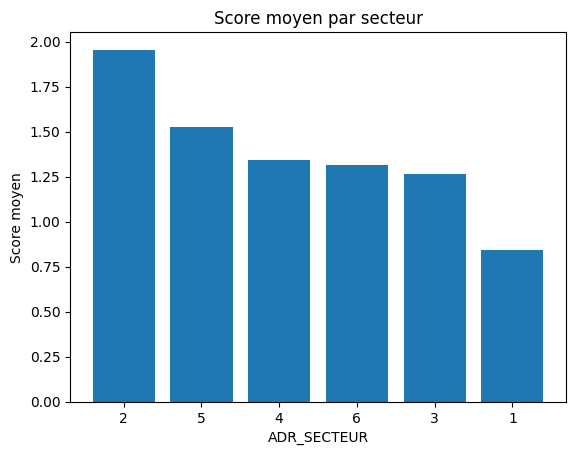

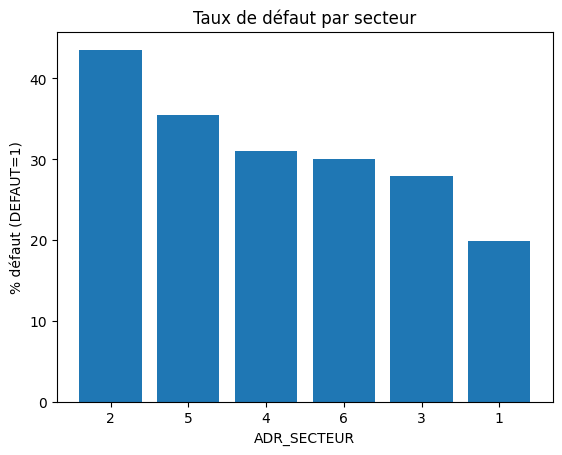

In [64]:
import numpy as np
import matplotlib.pyplot as plt

grp2 = grp.reset_index().sort_values("score_moy", ascending=False)

plt.figure()
plt.bar(grp2["ADR_SECTEUR"].astype(str), grp2["score_moy"])
plt.xlabel("ADR_SECTEUR")
plt.ylabel("Score moyen")
plt.title("Score moyen par secteur")
plt.show()

plt.figure()
plt.bar(grp2["ADR_SECTEUR"].astype(str), grp2["pct_defaut"])
plt.xlabel("ADR_SECTEUR")
plt.ylabel("% défaut (DEFAUT=1)")
plt.title("Taux de défaut par secteur")
plt.show()